In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import parquet_tools


In [2]:
df = pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/df_merged_etf_3170cols_final.csv')

In [3]:
df

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,three_mo,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,3163,AVNM,NaN,0.31,2.627800e+05,NaN,Avantis All International Markets Equity ETF,NaN,NaN,NaN,...,1.300000e+05,1.300000e+05,1.300000e+05,1.300000e+05,2023-07-25,U.S. - Total Market,Equity,Global Ex,Equity,standard
3164,3164,SPKY,NaN,0.79,2.460500e+05,NaN,ConvexityShares Daily 1.5x SPIKES Futures ETF,NaN,NaN,NaN,...,-1.300000e+05,2.400000e+05,1.760000e+06,1.760000e+06,2023-07-25,Term,Leveraged Alternatives,Volatility S&P 500 Short,Leveraged Alternatives,leveraged
3165,3165,FLRU,NaN,0.19,8.000000e+03,NaN,Franklin FTSE Russia ETF,CCC,NaN,NaN,...,NaN,NaN,NaN,1.209000e+07,NaN,Total Market,Equity,Russia,Equity,standard
3166,3166,SROI,NaN,0.95,NaN,1.93,Calamos Antetokounmpo Global Sustainable Equit...,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2023-07-25,Total Market,Equity,Global,Equity,standard


In [4]:
#df.to_csv('/Users/kk/Desktop/etf_addendum/FINAL ETF TABLE/df_merged_etf_fixed_2.csv')

In [5]:
df.isnull().sum()

Unnamed: 0                            0
ticker                                0
one_yr_return                       438
expense_ratio                         9
aum                                   2
dividend_yield                     1499
fundname                              1
esg_rating                          985
quality_score                      1088
score_peer_rank                    1088
score_global_rank                  1128
carbon_intensity                   1177
sri_screening_criteria_exposure    1499
analyst_pick                          0
grade                              1648
efficiency                         1056
tradability                        1200
fit                                2194
segment                               0
one_mo_p_percent                     56
three_mo_p_percent                  131
ytd_p_percent                       241
one_yr_p_percent                    438
three_yr_p_percent                 1183
five_yr_p_percent                  1583


In [6]:
df.dividend_yield = df.dividend_yield.astype('float')

In [7]:
df.dtypes

Unnamed: 0                           int64
ticker                              object
one_yr_return                      float64
expense_ratio                      float64
aum                                float64
dividend_yield                     float64
fundname                            object
esg_rating                          object
quality_score                      float64
score_peer_rank                    float64
score_global_rank                  float64
carbon_intensity                   float64
sri_screening_criteria_exposure    float64
analyst_pick                          bool
grade                               object
efficiency                         float64
tradability                        float64
fit                                float64
segment                             object
one_mo_p_percent                   float64
three_mo_p_percent                 float64
ytd_p_percent                      float64
one_yr_p_percent                   float64
three_yr_p_

In [8]:
measures = df.select_dtypes(include=['number'])

In [9]:
measures.columns

Index(['Unnamed: 0', 'one_yr_return', 'expense_ratio', 'aum', 'dividend_yield',
       'quality_score', 'score_peer_rank', 'score_global_rank',
       'carbon_intensity', 'sri_screening_criteria_exposure', 'efficiency',
       'tradability', 'fit', 'one_mo_p_percent', 'three_mo_p_percent',
       'ytd_p_percent', 'one_yr_p_percent', 'three_yr_p_percent',
       'five_yr_p_percent', 'ten_yr_p_percent', 'one_mo', 'three_mo', 'ytd',
       'one_yr', 'three_yr'],
      dtype='object')

In [10]:
dimensions = df.select_dtypes(exclude=['number'])

In [11]:
dimensions.columns

Index(['ticker', 'fundname', 'esg_rating', 'analyst_pick', 'grade', 'segment',
       'as_of_date', 'subsegment', 'asset_class', 'region', 'asset_class_2',
       'asset_class_filter'],
      dtype='object')

In [12]:
# Split the 'segment' column into two separate columns
df[['mainsegment', 'subsegment']] = df['segment'].str.split("-", expand=True, n=1)

# Display the head of 'segment' column after splitting
#print(df_analysis['segment'].head())

# Display the DataFrame with the new 'mainsegment' and 'subsegment' columns
df.head(1)


,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter,mainsegment
0,0,SPY,17.03,0.09,4.259800e+11,1.6,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,Equity: U.S.


---------

# Create new filter set for asset class

-----------

In [13]:
df[['asset_class', 'region']] = df['mainsegment'].str.split(":", expand=True, n=1)

# Display the head of 'segment' column after splitting
#print(df_analysis['segment'].head())

# Display the DataFrame with the new 'mainsegment' and 'subsegment' columns
df.head(1)

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter,mainsegment
0,0,SPY,17.03,0.09,4.259800e+11,1.6,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,Equity: U.S.


In [14]:
df.drop('mainsegment', axis=1, inplace=True)

In [15]:
df['asset_class_2'] =df['asset_class']

In [16]:
df.asset_class.unique() # 142


array(['Equity', 'Fixed Income', 'Commodities', 'Leveraged Equity',
       'Inverse Equity', 'Leveraged Fixed Income', 'Asset Allocation',
       'Currency', 'Leveraged Commodities', 'Alternatives',
       'Inverse Fixed Income', 'Inverse Alternatives',
       'Leveraged Alternatives', 'Inverse Commodities',
       'Inverse Currency', 'Leveraged Currency',
       'Leveraged Asset Allocation'], dtype=object)

In [17]:
# Define the conditions and choices for each subsegment filter
conditions = [
    df['asset_class'].str.strip().str.contains(r'Leveraged', case=False, regex=True).astype(bool),
    df['asset_class'].str.strip().str.contains(r'Inverse', case=False, regex=True).astype(bool)]
   
 

choices = [
    'leveraged',
    'inverse'
    ]

# Apply numpy.select() to create the new column
df['asset_class_filter'] = np.select(conditions, choices, default='standard')

# View the updated DataFrame with the new 'asset_class_filter' column
print(df.head())


   Unnamed: 0 ticker  one_yr_return  expense_ratio           aum  \
0           0    SPY          17.03           0.09  4.259800e+11   
1           1    IVV          17.08           0.03  3.516200e+11   
2           2    VOO          17.09           0.03  3.363100e+11   
3           3    VTI          16.46           0.03  3.196800e+11   
4           4    QQQ          27.05           0.20  2.093000e+11   

   dividend_yield                         fundname esg_rating  quality_score  \
0            1.60           SPDR S&P 500 ETF Trust          A           6.68   
1            1.60         iShares Core S&P 500 ETF          A           6.68   
2            1.60          Vanguard 500 Index Fund          A           6.68   
3            1.56  Vanguard Total Stock Market ETF          A           6.52   
4            0.75                Invesco QQQ Trust          A           6.71   

   score_peer_rank  ...      three_mo           ytd        one_yr  \
0            58.71  ...  8.169170e+09  1.

In [18]:
#df['asset_class_2'].unique()

In [19]:
'''

# Define the conditions and choices for each subsegment filter
conditions = [
    df['asset_class_2'].str.strip().str.contains(r'Equity', case=False, regex=True).astype(bool),
    df['asset_class_2'].str.strip().str.contains(r'Fixed Income', case=False, regex=True).astype(bool),
    df['asset_class_2'].str.strip().str.contains(r'Commodities', case=False, regex=True).astype(bool),
    df['asset_class_2'].str.strip().str.contains(r'Asset Allocation', case=False, regex=True).astype(bool),
    df['asset_class_2'].str.strip().str.contains(r'Alternatives', case=False, regex=True).astype(bool),
    df['asset_class_2'].str.strip().str.contains(r'Currency', case=False, regex=True).astype(bool)]
   
 

choices = [
    'equity',
    'fixed_income',
    'commodities',
    'asset_allocation'
    'alternatives',
    'currency']

# Apply numpy.select() to create the new column
df['asset_class_2_filter'] = np.select(conditions, choices, default='other')

# View the updated DataFrame with the new 'asset_class_filter' column'''


"\n\n# Define the conditions and choices for each subsegment filter\nconditions = [\n    df['asset_class_2'].str.strip().str.contains(r'Equity', case=False, regex=True).astype(bool),\n    df['asset_class_2'].str.strip().str.contains(r'Fixed Income', case=False, regex=True).astype(bool),\n    df['asset_class_2'].str.strip().str.contains(r'Commodities', case=False, regex=True).astype(bool),\n    df['asset_class_2'].str.strip().str.contains(r'Asset Allocation', case=False, regex=True).astype(bool),\n    df['asset_class_2'].str.strip().str.contains(r'Alternatives', case=False, regex=True).astype(bool),\n    df['asset_class_2'].str.strip().str.contains(r'Currency', case=False, regex=True).astype(bool)]\n   \n \n\nchoices = [\n    'equity',\n    'fixed_income',\n    'commodities',\n    'asset_allocation'\n    'alternatives',\n    'currency']\n\n# Apply numpy.select() to create the new column\ndf['asset_class_2_filter'] = np.select(conditions, choices, default='other')\n\n# View the updated D

In [20]:
df['asset_class_filter'].nunique()

3

In [21]:
df.head()

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,three_mo,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard


-----------

# Create new filter set for asset regions

-----------

In [22]:
df.head()

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,three_mo,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard


In [23]:

# Define the conditions and choices for each region filter
conditions = [
    df['region'].str.strip().str.contains(r'U\.S\.|California|Local|Minnesota', case=False),
    df['region'].str.strip().str.contains(r'Global|Broad|Agriculture|Metals|Energy|Frontier|Hedge Fund|Frontier|Volatility|Spreads', case=False),
    df['region'].str.strip().str.contains(r'Developed Markets|G10', case=False),
    df['region'].str.strip().str.contains(r'Emerging Markets', case=False),
    df['region'].str.strip().str.contains(r'Asia|Japan|Taiwan|South Korea|Malaysia|Vietnam|Thailand|Hong Kong|Pakistan|JPY|Philippines|Indonesia|AUD|Australia|New Zealand', case=False),
    df['region'].str.strip().str.contains(r'North America|Canada|Puerto Rico|USD|Mexico|Colombia|Argentina|Latin America|Peru|Chile', case=False),
    df['region'].str.strip().str.contains(r'Europe|EUR|Netherlands|Germany|Spain|Sweden|Poland|Denmark|U.K.|Italy|France|Switzerland|CHF|Belgium|Finland|Norway|Austria|Portugal|Ireland|Greece', case=False),
    df['region'].str.strip().str.contains(r'Brazil|Russia|India|China|South Africa|CNY|Singapore', case=False),
    df['region'].str.strip().str.contains(r'Africa|Egypt|Nigeria', case=False),
    df['region'].str.strip().str.contains(r'Arab|Israel|Qatar|Kuwait', case=False)
]

choices = [
    'region_us',
    'region_global',
    'region_dev_markets',
    'region_emerg_markets',
    'region_asia_pacific_wo_brics',
    'region_america_wo_us',
    'region_europe',
    'region_brics',
    'region_africa_wo_brics',
    'region_mid_east'
]

# Apply numpy.select() to create the new column
df['region_filter'] = np.select(conditions, choices, default='region_rest')

# View the updated DataFrame with the new 'region_filter' column
df.head()


,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter,region_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,region_us
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,region_us
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,region_us
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard,region_us
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,region_us


In [24]:
df.region_filter.isna()

0       False
1       False
2       False
3       False
4       False
        ...  
3163    False
3164    False
3165    False
3166    False
3167    False
Name: region_filter, Length: 3168, dtype: bool

------------

<Axes: xlabel='region_filter', ylabel='count'>

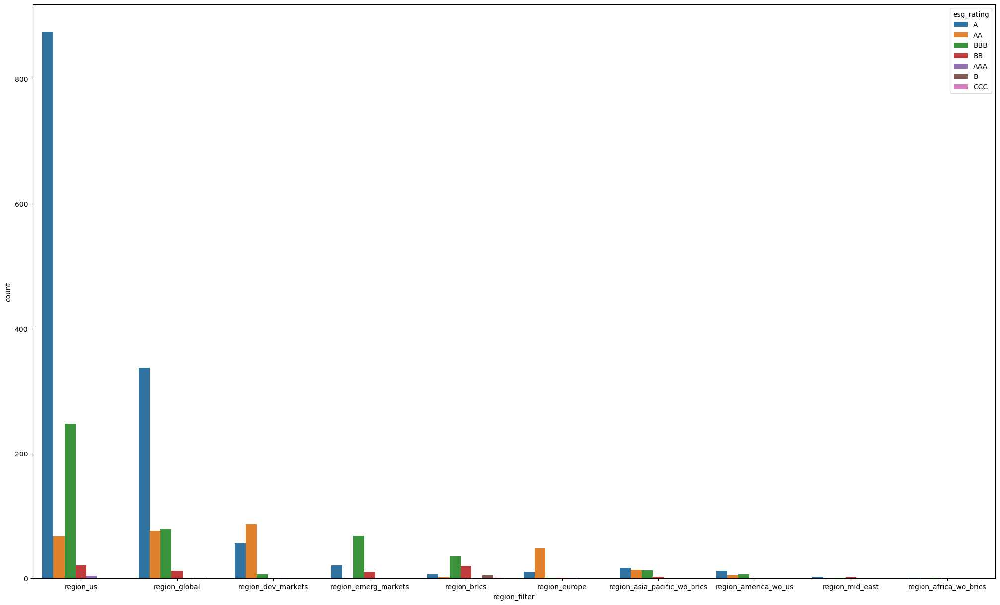

In [25]:
fig = plt.figure(figsize=(25, 15))


sns.countplot(data=df, x='region_filter', order = df['region_filter'].value_counts().index,  hue="esg_rating")

----------

# Set new filter for subsegments

In [26]:
df.subsegment.unique()

array(['  Large Cap', '  Total Market', 'U.S.  -  Total Market',
       '  Large Cap Value', 'North America  -  Total Market',
       ' Broad Market, Broad-based Investment Grade',
       '  Large Cap Growth', '  Mid Cap', '  Small Cap', None,
       'U.S. - Broad Market, Broad-based Investment Grade',
       '  High Dividend Yield',
       ' Government, Treasury Investment Grade Long-Term',
       ' Corporate, Broad-based Investment Grade Intermediate',
       ' Corporate, Broad-based Investment Grade',
       ' Corporate, Broad-based Investment Grade Short-Term',
       ' Broad Market, Broad-based Investment Grade Short-Term',
       ' Government, Local Authority/Municipal Investment Grade',
       ' Government, Treasury Investment Grade Intermediate',
       ' Government, Treasury Investment Grade Ultra-Short Term',
       ' Government, Mortgage-backed Investment Grade',
       ' Government, Treasury Investment Grade Short-Term',
       '  Small Cap Value', ' Government, Treasury In

In [27]:
# Define the conditions and choices for each subsegment filter
conditions = [
    df['subsegment'].str.strip().str.contains(r'Large Cap', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Small Cap|Micro Cap', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Corporate', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Government|Municipals', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Broad-based|Broad Market|Broad Thematic', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'High Dividend Yield', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Floating Rate', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Ultra-Short Term', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Commodities', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Intermediate', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Inflation-linked', case=False, regex=True).astype(bool),    
    df['subsegment'].str.strip().str.contains(r'Short-Term|Short Term', case=False, regex=True).astype(bool), 
    df['subsegment'].str.strip().str.contains(r'Low Carbon', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Asset-backed', case=False, regex=True).astype(bool), 
    df['subsegment'].str.strip().str.contains(r'Automobile', case=False, regex=True).astype(bool), 
    df['subsegment'].str.strip().str.contains(r'Treasury', case=False, regex=True).astype(bool), 
    df['subsegment'].str.strip().str.contains(r'Internet', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Total Market', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Extended Market', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Mid Cap', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Target', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Real Estate', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Term', case=False, regex=True).astype(bool),
    df['subsegment'].str.strip().str.contains(r'Technology Hardware Storage & Peripheral', case=False, regex=True).astype(bool)]

choices = [
    'large_cap',
    'small_cap',
    'corporate',
    'government',
    'broad-based',
    'high_dividend_yield',
    'floating_rate',
    'ultra-short_term',
    'commodities',
    'other',
    'inflation-linked',
    'other',
    'low carbon',
    'asset-backed',
    'other',
    'treasury',
    'industry_and_tech',
    'total_market',
    'extended_market',
    'mid_cap',
    'other',
    'other',
    'other', 
    'industry_and_tech'
]

# Apply numpy.select() to create the new column
df['subsegment_filter'] = np.select(conditions, choices, default= 'subsegment_rest')


# View the updated DataFrame with the new 'subsegment_filter' column
print(df.head())


   Unnamed: 0 ticker  one_yr_return  expense_ratio           aum  \
0           0    SPY          17.03           0.09  4.259800e+11   
1           1    IVV          17.08           0.03  3.516200e+11   
2           2    VOO          17.09           0.03  3.363100e+11   
3           3    VTI          16.46           0.03  3.196800e+11   
4           4    QQQ          27.05           0.20  2.093000e+11   

   dividend_yield                         fundname esg_rating  quality_score  \
0            1.60           SPDR S&P 500 ETF Trust          A           6.68   
1            1.60         iShares Core S&P 500 ETF          A           6.68   
2            1.60          Vanguard 500 Index Fund          A           6.68   
3            1.56  Vanguard Total Stock Market ETF          A           6.52   
4            0.75                Invesco QQQ Trust          A           6.71   

   score_peer_rank  ...        one_yr      three_yr  as_of_date  \
0            58.71  ...  1.330168e+10  2.27

In [28]:
print(df.subsegment_filter.unique())

['large_cap' 'total_market' 'broad-based' 'mid_cap' 'small_cap'
 'subsegment_rest' 'high_dividend_yield' 'government' 'corporate'
 'extended_market' 'other' 'low carbon' 'industry_and_tech']


<Axes: xlabel='subsegment_filter', ylabel='count'>

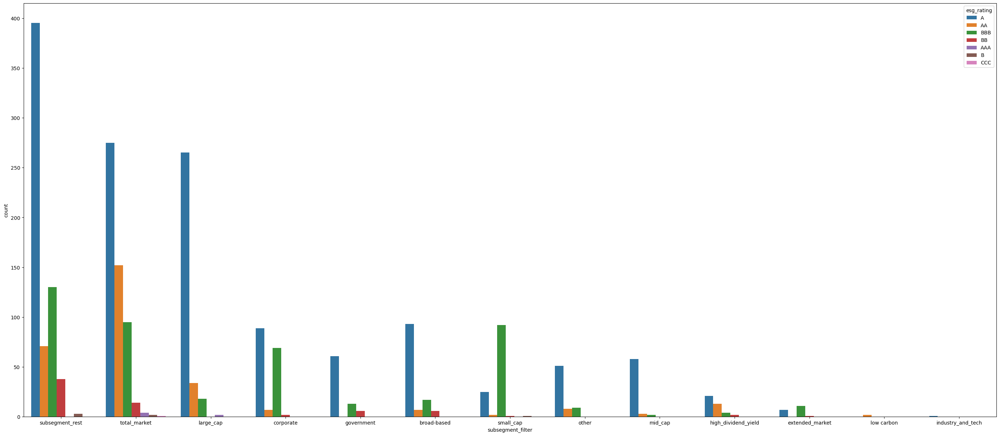

In [29]:
fig = plt.figure(figsize=(35, 15))


sns.countplot(data=df, x='subsegment_filter', order = df['subsegment_filter'].value_counts().index, hue="esg_rating")

----------

# Plot  the size and the count of new filter sets

-----------

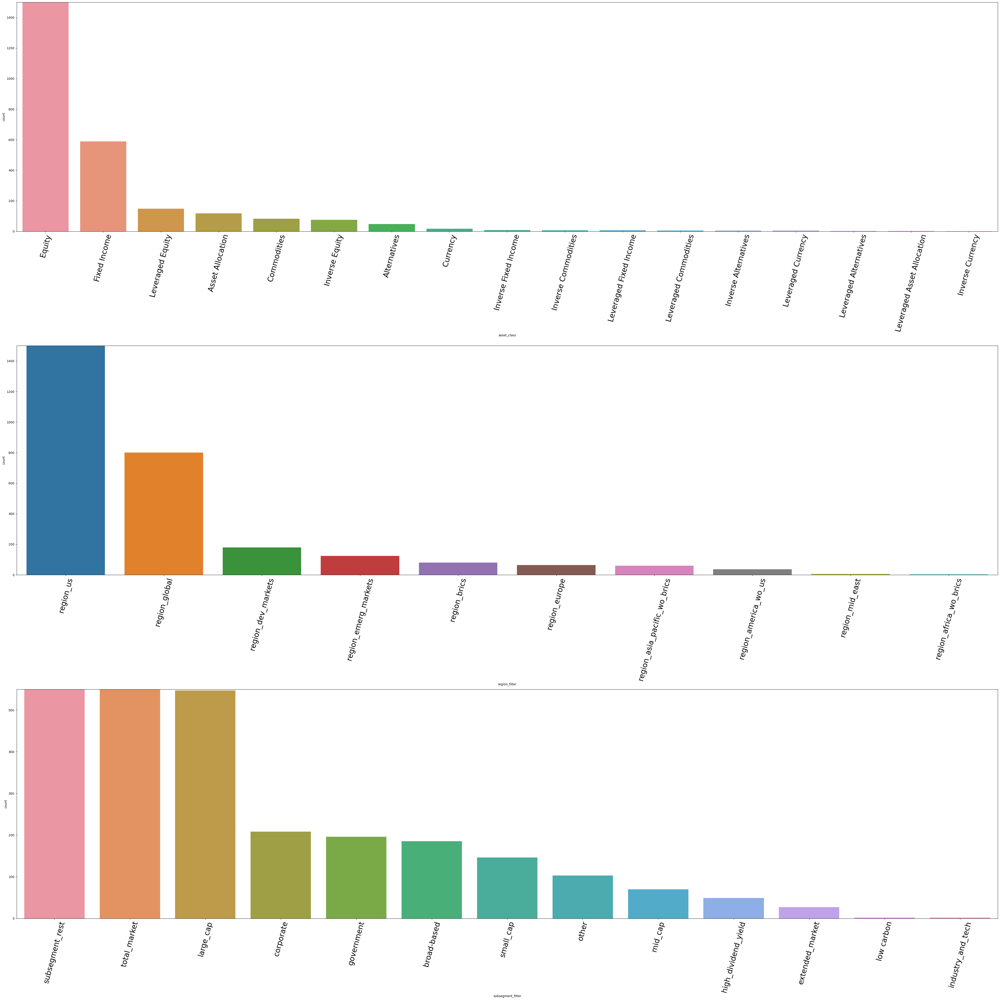

In [30]:


fig = plt.figure(figsize=(45, 45))

# Creating the subplots
ax1 = fig.add_subplot(3, 1, 1)
ax2 = fig.add_subplot(3, 1, 2)
ax3 = fig.add_subplot(3, 1, 3)


# Adjusting limits for each subplot (Modify the limits as needed)
# Rotating x-axis tick labels by 45 degrees
ax1.tick_params(axis='x', rotation=75, labelsize=24)
ax2.tick_params(axis='x', rotation=75, labelsize=24)
ax3.tick_params(axis='x', rotation=75, labelsize=24)

ax1.set_ylim(0, 1500)
ax2.set_ylim(0, 1500)
ax3.set_ylim(0, 550)

#ax1 = ax1.set_xlabel('asset_class', fontsize= 16)
#ax2 = ax2.set_xlabel('region', fontsize =16)
#ax3 = ax3.set_xlabel('subsegment', fontsize = 16)


# Plotting the countplots on respective subplots
sns.countplot(data=df, x='asset_class', ax=ax1, order = df['asset_class'].value_counts().index)#, hue="segment")
sns.countplot(data=df, x='region_filter', ax=ax2, order = df['region_filter'].value_counts().index)#, hue="segment")
sns.countplot(data=df, x='subsegment_filter', ax=ax3, order = df['subsegment_filter'].value_counts().index)#, hue ="segment")



# Adjusting layout to avoid overlapping
plt.tight_layout()

# Display the plot
plt.show()


-----------

# Create Dummies

In [31]:
df.columns

Index(['Unnamed: 0', 'ticker', 'one_yr_return', 'expense_ratio', 'aum',
       'dividend_yield', 'fundname', 'esg_rating', 'quality_score',
       'score_peer_rank', 'score_global_rank', 'carbon_intensity',
       'sri_screening_criteria_exposure', 'analyst_pick', 'grade',
       'efficiency', 'tradability', 'fit', 'segment', 'one_mo_p_percent',
       'three_mo_p_percent', 'ytd_p_percent', 'one_yr_p_percent',
       'three_yr_p_percent', 'five_yr_p_percent', 'ten_yr_p_percent', 'one_mo',
       'three_mo', 'ytd', 'one_yr', 'three_yr', 'as_of_date', 'subsegment',
       'asset_class', 'region', 'asset_class_2', 'asset_class_filter',
       'region_filter', 'subsegment_filter'],
      dtype='object')

In [32]:
df.region_filter.head()

0    region_us
1    region_us
2    region_us
3    region_us
4    region_us
Name: region_filter, dtype: object

In [33]:
region_dummies = pd.get_dummies(df.region_filter)


In [34]:
region_dummies = region_dummies.astype(int)

In [35]:
region_dummies.head()


,region_africa_wo_brics,region_america_wo_us,region_asia_pacific_wo_brics,region_brics,region_dev_markets,region_emerg_markets,region_europe,region_global,region_mid_east,region_us
0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,1


-------------

In [36]:
df.asset_class_filter.head()

0    standard
1    standard
2    standard
3    standard
4    standard
Name: asset_class_filter, dtype: object

In [37]:
asset_class_dummies = pd.get_dummies(df.asset_class_filter)

In [38]:
asset_class_dummies = asset_class_dummies.astype(int)

In [39]:
asset_class_dummies.head()

,inverse,leveraged,standard
0,0,0,1
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


---------------

In [40]:
df.subsegment_filter.head()

0       large_cap
1       large_cap
2       large_cap
3    total_market
4       large_cap
Name: subsegment_filter, dtype: object

In [41]:
subsegment_dummies = pd.get_dummies(df.subsegment_filter)

In [42]:
subsegment_dummies = subsegment_dummies.astype(int)

In [43]:
subsegment_dummies.head()

,broad-based,corporate,extended_market,government,high_dividend_yield,industry_and_tech,large_cap,low carbon,mid_cap,other,small_cap,subsegment_rest,total_market
0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1,0,0,0,0,0,0


------------

In [44]:
df.columns

Index(['Unnamed: 0', 'ticker', 'one_yr_return', 'expense_ratio', 'aum',
       'dividend_yield', 'fundname', 'esg_rating', 'quality_score',
       'score_peer_rank', 'score_global_rank', 'carbon_intensity',
       'sri_screening_criteria_exposure', 'analyst_pick', 'grade',
       'efficiency', 'tradability', 'fit', 'segment', 'one_mo_p_percent',
       'three_mo_p_percent', 'ytd_p_percent', 'one_yr_p_percent',
       'three_yr_p_percent', 'five_yr_p_percent', 'ten_yr_p_percent', 'one_mo',
       'three_mo', 'ytd', 'one_yr', 'three_yr', 'as_of_date', 'subsegment',
       'asset_class', 'region', 'asset_class_2', 'asset_class_filter',
       'region_filter', 'subsegment_filter'],
      dtype='object')

In [45]:
df_dum = df.merge(subsegment_dummies,right_index=True, left_index=True )

In [46]:
df_dum = df_dum.merge(region_dummies ,right_index=True, left_index=True )

In [47]:
df_dum = df_dum.merge(asset_class_dummies ,right_index=True, left_index=True )

In [48]:
df_dum.dtypes

Unnamed: 0           int64
ticker              object
one_yr_return      float64
expense_ratio      float64
aum                float64
                    ...   
region_mid_east      int64
region_us            int64
inverse              int64
leveraged            int64
standard             int64
Length: 65, dtype: object

In [49]:
#df_dum.to_csv('/Users/kk/Desktop/etf_addendum/FINAL ETF TABLE/df_dum.csv')

In [50]:
df_dum['asset_class_2'].replace({
    'Equity': 'equity',
    'Fixed Income': 'fixed_income',
    'Commodities': 'commodities',
    'Leveraged Equity': 'equity',
    'Inverse Equity': 'equity',
    'Leveraged Fixed Income': 'fixed_income', 
    'Asset Allocation': 'asset_allocation',
    'Currency': 'currency',
    'Leveraged Commodities': 'commodities',
    'Alternatives': 'alternatives',
    'Inverse Fixed Income': 'fixed_income',
    'Inverse Alternatives': 'alternatives',
    'Leveraged Alternatives': 'alternatives', 
    'Inverse Commodities': 'commodities',
    'Inverse Currency': 'currency',
    'Leveraged Currency': 'currency',
    'Leveraged Asset Allocation': 'asset_allocations'
}, inplace=True)


In [51]:
df_dum.to_csv('/Users/kk/Desktop/etf_addendum/FINAL ETF TABLE/df_dum_raw.csv')

In [52]:
df_dum.head()

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,region_brics,region_dev_markets,region_emerg_markets,region_europe,region_global,region_mid_east,region_us,inverse,leveraged,standard
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,0,0,0,0,0,0,1,0,0,1
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,0,0,0,0,0,0,1,0,0,1
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,0,0,0,0,0,0,1,0,0,1
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,0,0,0,0,0,0,1,0,0,1
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,0,0,0,0,0,0,1,0,0,1


In [53]:
df_dum.columns

Index(['Unnamed: 0', 'ticker', 'one_yr_return', 'expense_ratio', 'aum',
       'dividend_yield', 'fundname', 'esg_rating', 'quality_score',
       'score_peer_rank', 'score_global_rank', 'carbon_intensity',
       'sri_screening_criteria_exposure', 'analyst_pick', 'grade',
       'efficiency', 'tradability', 'fit', 'segment', 'one_mo_p_percent',
       'three_mo_p_percent', 'ytd_p_percent', 'one_yr_p_percent',
       'three_yr_p_percent', 'five_yr_p_percent', 'ten_yr_p_percent', 'one_mo',
       'three_mo', 'ytd', 'one_yr', 'three_yr', 'as_of_date', 'subsegment',
       'asset_class', 'region', 'asset_class_2', 'asset_class_filter',
       'region_filter', 'subsegment_filter', 'broad-based', 'corporate',
       'extended_market', 'government', 'high_dividend_yield',
       'industry_and_tech', 'large_cap', 'low carbon', 'mid_cap', 'other',
       'small_cap', 'subsegment_rest', 'total_market',
       'region_africa_wo_brics', 'region_america_wo_us',
       'region_asia_pacific_wo_brics

In [54]:
original_nums = df.iloc[:,[1, 2, 3, 4, 5, 8, 9, 10, 11, 12, 15, 16, 17, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]]
original_nums.head()

,ticker,one_yr_return,expense_ratio,aum,dividend_yield,quality_score,score_peer_rank,score_global_rank,carbon_intensity,sri_screening_criteria_exposure,...,ytd_p_percent,one_yr_p_percent,three_yr_p_percent,five_yr_p_percent,ten_yr_p_percent,one_mo,three_mo,ytd,one_yr,three_yr
0,SPY,17.03,0.09,4.259800e+11,1.60,6.68,58.71,47.34,122.31,9.75,...,20.00,17.03,14.09,11.79,12.48,2.691510e+09,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10
1,IVV,17.08,0.03,3.516200e+11,1.60,6.68,58.67,47.01,122.41,9.67,...,20.04,17.08,14.15,11.82,12.54,9.267710e+09,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10
2,VOO,17.09,0.03,3.363100e+11,1.60,6.68,58.75,47.99,122.47,9.76,...,20.09,17.09,14.15,11.82,12.55,9.917650e+09,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11
3,VTI,16.46,0.03,3.196800e+11,1.56,6.52,52.51,24.74,122.61,8.86,...,19.61,16.46,13.42,10.98,11.98,2.046560e+09,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11
4,QQQ,27.05,0.20,2.093000e+11,0.75,6.71,59.94,55.16,47.01,8.36,...,42.66,27.05,14.71,16.50,18.66,7.232160e+09,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10


In [55]:
original_nums.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ticker                           3168 non-null   object 
 1   one_yr_return                    2730 non-null   float64
 2   expense_ratio                    3159 non-null   float64
 3   aum                              3166 non-null   float64
 4   dividend_yield                   1669 non-null   float64
 5   quality_score                    2080 non-null   float64
 6   score_peer_rank                  2080 non-null   float64
 7   score_global_rank                2040 non-null   float64
 8   carbon_intensity                 1991 non-null   float64
 9   sri_screening_criteria_exposure  1669 non-null   float64
 10  efficiency                       2112 non-null   float64
 11  tradability                      1968 non-null   float64
 12  fit                 

In [56]:
original_nums = original_nums.to_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/original_nums.csv')

In [57]:
esg_dummies = pd.get_dummies(df.esg_rating)

In [58]:
esg_dummies = esg_dummies.astype(int)

In [59]:
esg_dummies.head()

,A,AA,AAA,B,BB,BBB,CCC
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0


In [60]:
grade_dummies = pd.get_dummies(df.grade)

In [61]:
grade_dummies = grade_dummies.astype(int)

In [62]:
grade_dummies.head()

,A,B,C,D,F
0,1,0,0,0,0
1,1,0,0,0,0
2,1,0,0,0,0
3,1,0,0,0,0
4,1,0,0,0,0


In [63]:
df_dum = df_dum.merge(esg_dummies ,right_index=True, left_index=True )

In [64]:
df_dum = df_dum.merge(grade_dummies ,right_index=True, left_index=True )

In [65]:
df_dum.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3168 entries, 0 to 3167
Data columns (total 77 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Unnamed: 0                       3168 non-null   int64  
 1   ticker                           3168 non-null   object 
 2   one_yr_return                    2730 non-null   float64
 3   expense_ratio                    3159 non-null   float64
 4   aum                              3166 non-null   float64
 5   dividend_yield                   1669 non-null   float64
 6   fundname                         3167 non-null   object 
 7   esg_rating                       2183 non-null   object 
 8   quality_score                    2080 non-null   float64
 9   score_peer_rank                  2080 non-null   float64
 10  score_global_rank                2040 non-null   float64
 11  carbon_intensity                 1991 non-null   float64
 12  sri_screening_criter

In [66]:
df_dum.drop('analyst_pick', axis=1, inplace=True)
#df_dum.drop('esg_rating', axis=1, inplace=True)
#df_dum.drop('grade', axis=1, inplace=True)
#df_dum.drop('segment', axis=1, inplace=True)
df_dum.drop('as_of_date', axis=1, inplace=True)
#df_dum.drop('subsegment', axis=1, inplace=True)
#df_dum.drop('asset_class', axis=1, inplace=True)
#df_dum.drop('region', axis=1, inplace=True)
#df_dum.drop('asset_class_2', axis=1, inplace=True)
#df_dum.drop('region_filter', axis=1, inplace=True)
#df_dum.drop('asset_class_filter', axis=1, inplace=True)
#df_dum.drop('subsegment_filter', axis=1, inplace=True)


In [67]:
df_dum.columns

Index(['Unnamed: 0', 'ticker', 'one_yr_return', 'expense_ratio', 'aum',
       'dividend_yield', 'fundname', 'esg_rating', 'quality_score',
       'score_peer_rank', 'score_global_rank', 'carbon_intensity',
       'sri_screening_criteria_exposure', 'grade', 'efficiency', 'tradability',
       'fit', 'segment', 'one_mo_p_percent', 'three_mo_p_percent',
       'ytd_p_percent', 'one_yr_p_percent', 'three_yr_p_percent',
       'five_yr_p_percent', 'ten_yr_p_percent', 'one_mo', 'three_mo', 'ytd',
       'one_yr', 'three_yr', 'subsegment', 'asset_class', 'region',
       'asset_class_2', 'asset_class_filter', 'region_filter',
       'subsegment_filter', 'broad-based', 'corporate', 'extended_market',
       'government', 'high_dividend_yield', 'industry_and_tech', 'large_cap',
       'low carbon', 'mid_cap', 'other', 'small_cap', 'subsegment_rest',
       'total_market', 'region_africa_wo_brics', 'region_america_wo_us',
       'region_asia_pacific_wo_brics', 'region_brics', 'region_dev_market

In [68]:
dummies = df_dum.iloc[:, -1:-39:-1]
dummies.head()

,F,D,C,B_y,A_y,CCC,BBB,BB,B_x,AAA,...,other,mid_cap,low carbon,large_cap,industry_and_tech,high_dividend_yield,government,extended_market,corporate,broad-based
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [69]:
import pandas as pd
dum2 = pd.get_dummies(df_dum.asset_class_2).astype('int')
dum2

,alternatives,asset_allocation,asset_allocations,commodities,currency,equity,fixed_income
0,0,0,0,0,0,1,0
1,0,0,0,0,0,1,0
2,0,0,0,0,0,1,0
3,0,0,0,0,0,1,0
4,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...
3163,0,0,0,0,0,1,0
3164,1,0,0,0,0,0,0
3165,0,0,0,0,0,1,0
3166,0,0,0,0,0,1,0


In [70]:
dummies['alternatives'] = dum2['alternatives']
dummies['asset_allocation'] = dum2['asset_allocation']
dummies['commodities'] = dum2['commodities']
dummies['currency'] = dum2['currency']
dummies['equity'] = dum2['equity']
dummies['fixed_income'] = dum2['fixed_income']

dummies.head()

,F,D,C,B_y,A_y,CCC,BBB,BB,B_x,AAA,...,government,extended_market,corporate,broad-based,alternatives,asset_allocation,commodities,currency,equity,fixed_income
0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [71]:
dummies = dummies.rename(columns={'F':'grade_F',	'D':'grade_D'	,'C':'grade_C'	,'B_y':'grade_B'	,'A_y': 'grade_A', 'A_x': 'A', 'B_x':'B'})

In [72]:
dummies = dummies.drop('subsegment_filter',axis=1)
dummies = dummies.drop('region_filter',axis=1)
dummies = dummies.drop('asset_class_filter',axis=1)
dummies = dummies.drop('asset_class_2',axis=1)
      

KeyError: "['subsegment_filter'] not found in axis"

In [ ]:
dummies['ticker'] = filters['ticker']

In [ ]:
dummies = dummies.to_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/dummies.csv')

In [ ]:
filters = df_dum.iloc[:,[1,6,7,13,30,31,32,33,34,35,36]]

In [ ]:
filters = filters.drop('asset_class', axis=1)
filters = filters.drop('region', axis=1)
filters = filters.drop('subsegment', axis=1)
filters.head()

,ticker,fundname,esg_rating,grade,asset_class_2,asset_class_filter,region_filter,subsegment_filter
0,SPY,SPDR S&P 500 ETF Trust,A,A,equity,standard,region_us,large_cap
1,IVV,iShares Core S&P 500 ETF,A,A,equity,standard,region_us,large_cap
2,VOO,Vanguard 500 Index Fund,A,A,equity,standard,region_us,large_cap
3,VTI,Vanguard Total Stock Market ETF,A,A,equity,standard,region_us,total_market
4,QQQ,Invesco QQQ Trust,A,A,equity,standard,region_us,large_cap


In [ ]:
filters = filters.rename(columns= {'asset_class_2':'asset_class', 'asset_class_filter': 'investment_strategy', 'region_filter': 'asset_region','subsegment_filter': 'subsegment'} )
filters.head()

,ticker,fundname,esg_rating,grade,asset_class,investment_strategy,asset_region,subsegment
0,SPY,SPDR S&P 500 ETF Trust,A,A,equity,standard,region_us,large_cap
1,IVV,iShares Core S&P 500 ETF,A,A,equity,standard,region_us,large_cap
2,VOO,Vanguard 500 Index Fund,A,A,equity,standard,region_us,large_cap
3,VTI,Vanguard Total Stock Market ETF,A,A,equity,standard,region_us,total_market
4,QQQ,Invesco QQQ Trust,A,A,equity,standard,region_us,large_cap


In [ ]:
filters['subsegment'] = filters.subsegment.replace({'subsegment_rest': 'not_specified', 'broad-based': 'broad_based'})
filters.subsegment.unique()

array(['large_cap', 'total_market', 'broad_based', 'mid_cap', 'small_cap',
       'not_specified', 'high_dividend_yield', 'government', 'corporate',
       'extended_market', 'other', 'low carbon', 'industry_and_tech'],
      dtype=object)

In [ ]:
filters.shape

(3168, 8)

In [ ]:


# Assuming 'filters' is your DataFrame containing the 'asset_region' column
filters['asset_region'] = filters['asset_region'].str.replace('region_', '')
unique_values = filters['asset_region'].unique()
print(unique_values)


['us' 'dev_markets' 'emerg_markets' 'global' 'europe'
 'asia_pacific_wo_brics' 'brics' 'america_wo_us' 'mid_east'
 'africa_wo_brics']


In [ ]:
filters = filters.to_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/filters.csv')

---------

In [ ]:
df_dum.to_csv('/Users/kk/Desktop/etf_addendum/FINAL ETF TABLE/df_etf_dummmies.csv')

In [ ]:
df_2 = pd.DataFrame()
df_2['ticker'] = df.ticker
df_2['dividend_yield'] = df.dividend_yield
df_2['expense_ratio'] = df.expense_ratio 
df_2['aum'] = df.aum
df_2['quality_score'] = df.quality_score
df_2['score_peer_rank'] = df.score_peer_rank
df_2['score_global_rank'] =df.score_global_rank
df_2['carbon_intensity']= df.carbon_intensity
df_2['sri_screening_criteria_exposure'] = df.sri_screening_criteria_exposure
df_2['efficiency'] = df.efficiency
df_2['tradability'] = df.tradability
df_2['fit'] = df.fit
df_2['one_mo_p_percent'] = df.one_mo_p_percent
df_2['three_mo_p_percent'] = df.three_mo_p_percent
df_2['ytd_p_percent'] = df.ytd_p_percent
df_2['one_yr_p_percent'] = df.one_mo_p_percent
df_2['three_yr_p_percent'] = df.three_yr_p_percent
df_2['five_yr_p_percent'] = df.five_yr_p_percent
df_2['ten_yr_p_percent'] = df.ten_yr_p_percent
df_2['one_mo'] = df.one_mo
df_2['three_mo'] = df.three_mo
df_2['ytd'] = df.ytd
df_2['one_yr'] = df.one_yr
df_2['three_yr'] = df.three_yr
df_2['asset_class'] = df.asset_class

/opt/homebrew/Caskroom/miniconda/base/envs/csp_base/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


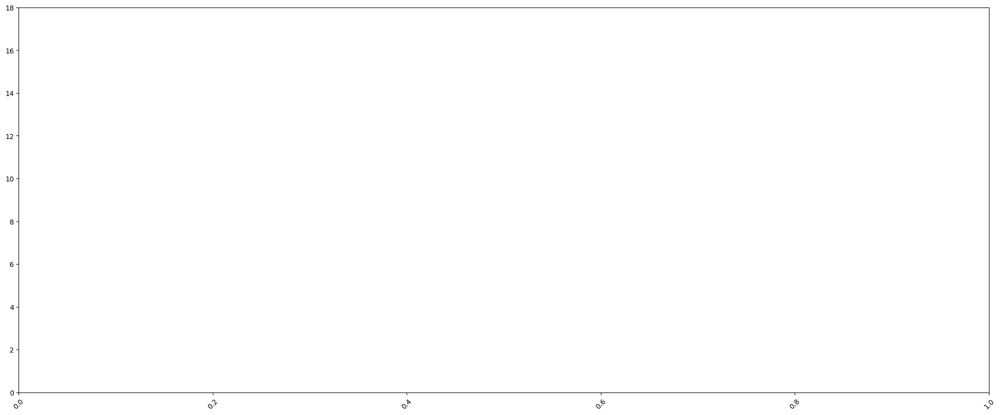

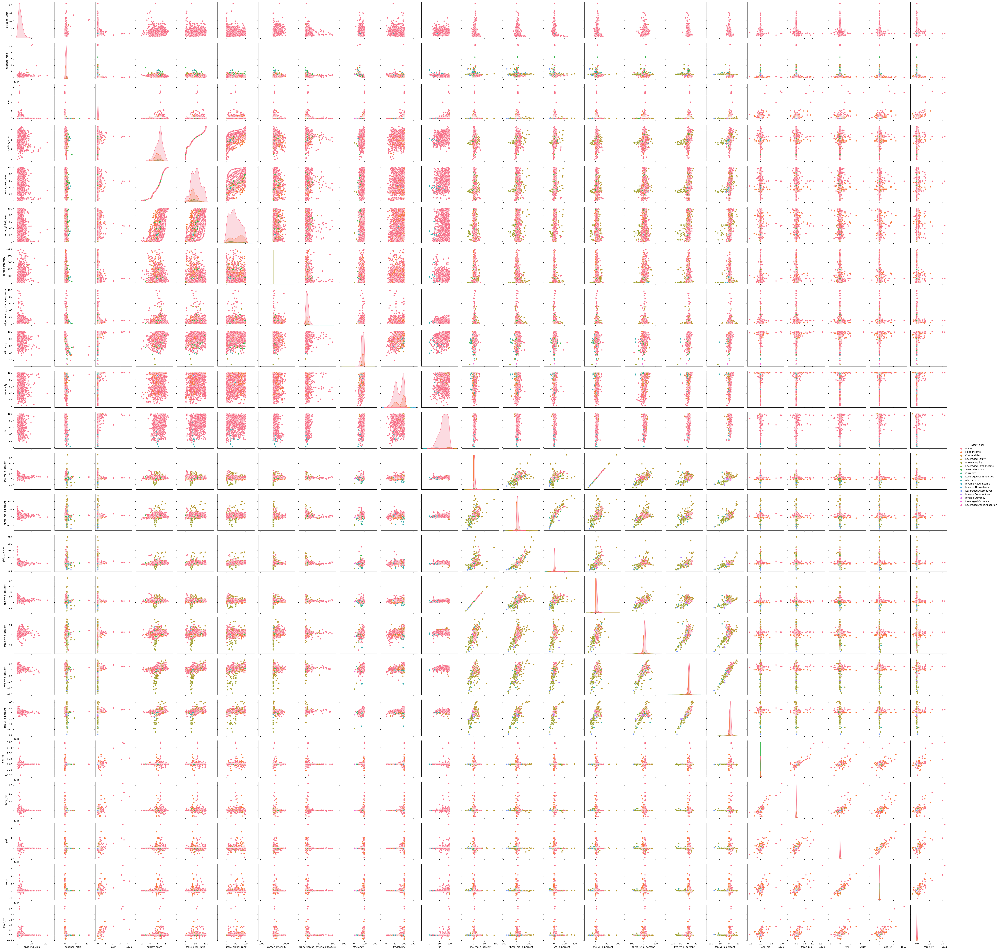

In [ ]:




# Creating the figure and subplot
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot()

# Rotating x-axis tick labels by 45 degrees
ax.tick_params(axis='x', rotation=45)

# Adjusting limits for the y-axis
ax.set_ylim(0, 18)

# Plotting the scatter plot using sns.pairplot with 'hue' parameter
sns.pairplot(data=df_2, hue='asset_class')

# Show the plot
plt.show()




In [ ]:
df_a = df.query('esg_rating.str.contains("A")')
df_b = df.query('esg_rating.str.contains("B")')
df_c = df.query('esg_rating.str.contains("C")')

ValueError: Cannot mask with non-boolean array containing NA / NaN values

In [ ]:
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot()
ax.set_xlim(450)
ax.set_ylim(450)

sns.countplot(data= df.head(100), x=df.mainsegment)

In [ ]:
df.subsegment.nunique()

In [ ]:
'''

import pandas as pd
import yfinance as yf

def get_etf_data(ticker):
    try:
        etf_data = yf.Ticker(ticker)
        return etf_data.history(period='1d', interval='1d')  # Get historical data for the ETF
    except Exception as e:
        print(f"Error fetching data for {ticker}: {e}")
        return None

def main():
    # Assuming you already have the DataFrame containing ETF tickers.
    # Replace 'your_column_name' with the actual column name containing the tickers.
    df = pd.read_csv('your_dataframe.csv')
    tickers_column = 'your_column_name'

    for ticker in df[tickers_column]:
        etf_df = get_etf_data(ticker)
        if etf_df is not None and not etf_df.empty:
            # Do further processing here if required.
            # For now, I'll just save the DataFrame to a Parquet file for each ETF.
            etf_df.to_parquet(f'{ticker}_data.parquet', index=True)

if __name__ == "__main__":
    main()
'''

In [ ]:
df.head()

,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,score_global_rank,...,three_yr_p_percent,five_yr_p_percent,ten_yr_p_percent,one_mo,three_mo,ytd,one_yr,three_yr,as_of_date,rated
0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,47.34,...,14.09,11.79,12.48,2.691510e+09,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,3.0
1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,47.01,...,14.15,11.82,12.54,9.267710e+09,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,3.0
2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,47.99,...,14.15,11.82,12.55,9.917650e+09,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,3.0
3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,24.74,...,13.42,10.98,11.98,2.046560e+09,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,3.0
4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,55.16,...,14.71,16.50,18.66,7.232160e+09,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,3.0


In [ ]:


# Sample data (replace this with your actual data)
data = {'ratings': ['AAA', 'A', 'BB', 'BBB', 'A', 'CCC', 'AA', 'BB', 'B']}
df['rated'] = pd.DataFrame(df.esg_rating)

# Rating to ordinal rank mapping
rating_map = {'AAA': 1, 'AA': 2, 'A': 3, 'BBB': 4, 'BB': 5, 'B': 6, 'CCC': 7, 'CC': 8, 'C': 9}

# Map ratings to their ordinal ranks
df['rated'] = df['rated'].map(rating_map)

df.head()



SyntaxError: invalid syntax (4170803865.py, line 13)

ModuleNotFoundError: No module named 'pipe'

<Axes: xlabel='esg_rating', ylabel='count'>

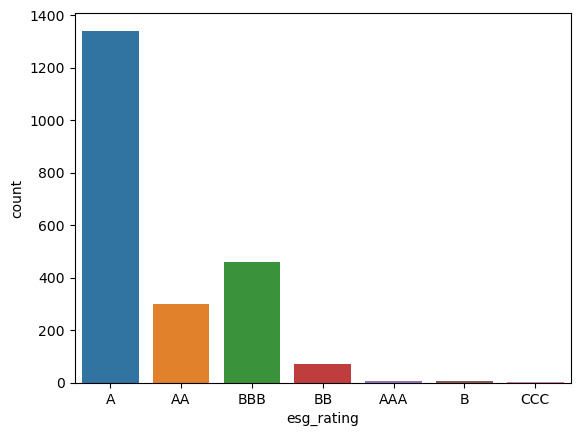

In [ ]:

sns.countplot(data=df, x='esg_rating')

<Axes: xlabel='rated', ylabel='count'>

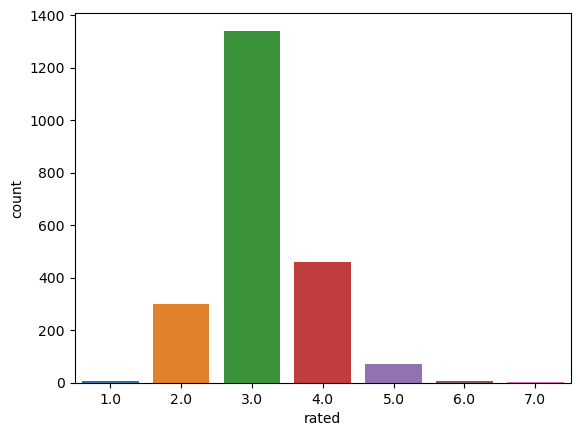

In [ ]:
sns.countplot(data=df, x='rated')

<Axes: xlabel='esg_rating', ylabel='count'>

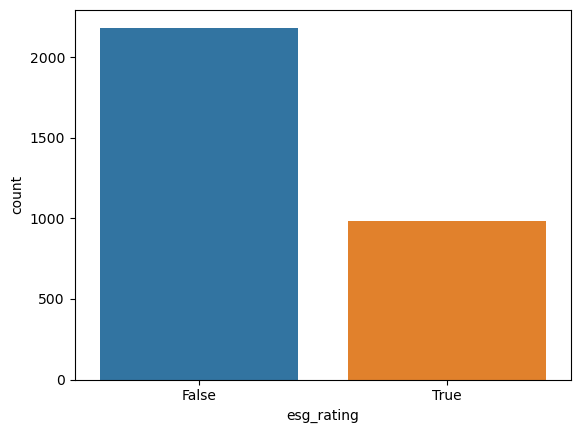

In [ ]:
sns.countplot(data=df.isna(), x='esg_rating')

In [ ]:
grouped_esg = pd.DataFrame(df.groupby(df.esg_rating))

In [ ]:
sns.boxplot(data=grouped_esg, x= 'esg_rating')

ValueError: Could not interpret input 'esg_rating'

In [ ]:
sns.boxplot(data= yield_grouped_esg, x= 'esg_rating')

NameError: name 'yield_grouped_esg' is not defined